<a href="https://colab.research.google.com/github/ambideXtrous9/Transformer-from-Scratch/blob/main/Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import math

In [ ]:
from transformers import AutoTokenizer

# **Tokenizer**

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("gpt2",use_fast=True)

In [ ]:
tokenizer

GPT2Tokenizer(name_or_path='gpt2', vocab_size=50257, model_max_length=1024, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>'}, added_tokens_decoder={
	50256: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
}
)

The `tokenizer()` method (which is the call method for the tokenizer object) accepts various parameters to control its behavior. Here are some of the most common and important ones:

*   **`text`**: (Required) The input text or list of texts to be tokenized.
    *   Example: `"Hello world"` or `["Hello world", "How are you?"]`

*   **`text_pair`**: (Optional) A second input text or list of texts to be tokenized along with `text`.
    *   Useful for tasks like natural language inference or question answering where you have two sequences.
    *   Example: `tokenizer("Question", "Answer")`

*   **`add_special_tokens`**: (Default `True`) Whether to add special tokens like `[CLS]`, `[SEP]`, `[PAD]` etc., to the sequences.

*   **`padding`**: (Default `False`) Controls padding behavior.
    *   `False` or `'do_not_pad'`: No padding is applied.
    *   `True` or `'longest'`: Pad to the longest sequence in the batch.
    *   `'max_length'`: Pad to a specified `max_length`.
    *   `'do_not_pad'`

*   **`truncation`**: (Default `False`) Controls truncation behavior.
    *   `False` or `'do_not_truncate'`: No truncation is applied.
    *   `True` or `'longest_first'`: Truncate to a specified `max_length`.
    *   `'only_first'`: Truncate only the first sequence if `text_pair` is provided.
    *   `'only_second'`: Truncate only the second sequence if `text_pair` is provided.

*   **`max_length`**: (Optional) The maximum length of the sequence after tokenization and padding/truncation. Used when `padding=True` or `truncation=True`.

*   **`return_tensors`**: (Optional) Specifies the type of tensors to return.
    *   `None` (default): Returns a list of integers.
    *   `'tf'`: Returns TensorFlow tensors.
    *   `'pt'`: Returns PyTorch tensors.
    *   `'np'`: Returns NumPy arrays.

*   **`return_attention_mask`**: (Default `True` if `return_tensors` is specified) Whether to return the attention mask.

*   **`return_token_type_ids`**: (Default `True` if `text_pair` is provided) Whether to return token type IDs (segment IDs).

*   **`return_offsets_mapping`**: (Default `False`) Whether to return offset mappings, which map tokens back to their original text spans.

*   **`return_length`**: (Default `False`) Whether to return the length of the tokenized sequence.

*   **`verbose`**: (Default `True`) Whether to print warnings during tokenization.

In [ ]:
tokenizer.encode("Hello world")

[15496, 995]

In [ ]:
out = tokenizer("Hello world", return_tensors="pt")

In [ ]:
out["input_ids"]

tensor([[15496,   995]])

In [ ]:
out["attention_mask"]

tensor([[1, 1]])

In [ ]:
tokenizer.add_special_tokens({'pad_token': '[PAD]'})

1

In [ ]:
sentence = "Hello world"

out = tokenizer(sentence,
                padding=True,
                add_special_tokens=True,
                truncation=True,
                max_length=32,
                return_attention_mask=True,
                return_tensors="pt")

In [ ]:
out["input_ids"]

tensor([[15496,   995]])

In [ ]:
out["attention_mask"]

tensor([[1, 1]])

## Padding works when encoding in batch

In [ ]:
sentence = ["Hello world", "How are you", "My name is Sushovan Saha"]

out = tokenizer(sentence,
                padding=True,
                add_special_tokens=True,
                truncation=True,
                max_length=32,
                return_attention_mask=True,
                return_tensors="pt")

In [ ]:
out["input_ids"]

tensor([[15496,   995, 50257, 50257, 50257, 50257, 50257, 50257],
        [ 2437,   389,   345, 50257, 50257, 50257, 50257, 50257],
        [ 3666,  1438,   318,   311,  1530, 22590,   311, 12236]])

The "attention_mask" is usually a tensor of the same shape as the input tokens, with values:

**1: indicates that the tokens at that position should be attended to (i.e., it's a valid token).**

**0: indicates that the token at that position should be ignored (i.e., its a padding token or otherwise should not be attended to).**

In [ ]:
out["attention_mask"]

tensor([[1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1]])

In [ ]:
token_id_pad = tokenizer.encode("[PAD]")
print(f"Token ID for '[PAD]': {token_id_pad}")

Token ID for '[PAD]': [50257]


In [ ]:
tokenizer.vocab_size

50257

In [ ]:
tokenizer.pad_token_id

50257

In [ ]:
print(tokenizer.vocab_size)
print(tokenizer.pad_token_id)

50257
50257


In [ ]:
print("vocab_size:", tokenizer.vocab_size)
print("len(tokenizer):", len(tokenizer))
print("pad_token:", tokenizer.pad_token)
print("pad_token_id:", tokenizer.pad_token_id)

vocab_size: 50257
len(tokenizer): 50258
pad_token: [PAD]
pad_token_id: 50257


### Interview-Level Understanding

There are two related but different concepts:

`tokenizer.vocab_size`

Original vocabulary size from pretrained model.

**Example:**

`50257`

`len(tokenizer)`

Current vocabulary size including newly added tokens.

**Example:**

`50258`

after adding:

`[PAD]`

# **Token Embedding**

In [ ]:
d_model = 512

In [ ]:
class TokenEmbedding(nn.Module):

  def __init__(self, vocab_size, d_model,pad_token):
    super().__init__()
    self.embed = nn.Embedding(vocab_size, d_model, padding_idx=pad_token)
    self.scale = math.sqrt(d_model)

  def forward(self, x):
    return self.embed(x) * self.scale

In [ ]:
te = TokenEmbedding(vocab_size=len(tokenizer),
                    d_model=d_model,
                    pad_token=tokenizer.pad_token_id)

In [ ]:
sentence = ["Hello world", "How are you", "My name is Sushovan Saha"]

out = tokenizer(sentence,
                padding=True,
                add_special_tokens=True,
                truncation=True,
                max_length=32,
                return_attention_mask=True,
                return_tensors="pt")

In [ ]:
out["input_ids"]

tensor([[15496,   995, 50257, 50257, 50257, 50257, 50257, 50257],
        [ 2437,   389,   345, 50257, 50257, 50257, 50257, 50257],
        [ 3666,  1438,   318,   311,  1530, 22590,   311, 12236]])

In [ ]:
out["input_ids"].size() # Batch, seq_len

torch.Size([3, 8])

In [ ]:
x = te(out["input_ids"])

In [ ]:
x.size() # Batch, seq_len, d_model(embed_len)

torch.Size([3, 8, 512])

In [ ]:
x[0].size()

torch.Size([8, 512])

In [ ]:
x[0][0].size()

torch.Size([512])

In [ ]:
x[0][0] # Embedding of a Token ("Hello")

tensor([ 1.0605e+01,  1.7820e+01, -2.3414e+01, -4.5744e+00, -2.0466e+01,
        -1.2512e+01,  5.3508e+01, -6.7296e+00,  4.8429e+00,  3.0581e+01,
         1.3664e+01, -1.5382e+01, -2.7875e+00,  3.4581e+01, -4.7603e+00,
         1.1053e+00, -2.5809e+01, -2.6474e+01, -1.5294e+01,  1.8681e+01,
        -2.4967e+01,  1.7126e+01, -1.0642e+01,  5.8737e+00, -1.1200e-01,
         2.2414e+01,  7.7997e+00,  3.3018e+00,  1.3770e+01,  8.5035e+00,
        -2.4294e+01,  2.6567e+01,  9.8649e+00,  9.5735e+00, -2.8253e+01,
         6.9837e-01,  7.9440e+00,  6.8587e+00,  3.0142e+00, -3.5816e+01,
         4.6537e+01,  1.4638e+01,  8.3028e+00, -1.9471e+01,  1.8132e+01,
         5.9210e+00,  4.2272e+01,  7.7612e+00,  8.5752e-01,  9.5765e+00,
        -3.6001e+01, -2.7318e+01,  2.4646e+01,  1.2894e+01,  3.8113e+01,
        -2.6607e+01,  1.9227e+01, -4.8102e+00,  1.8258e+01,  1.0657e+01,
        -1.5112e+01,  4.7475e+01,  4.9367e+00, -2.6992e+01,  9.2364e-01,
         1.3497e+01,  2.6576e+01,  7.3408e+00, -9.7

## **PositionalEmbedding**

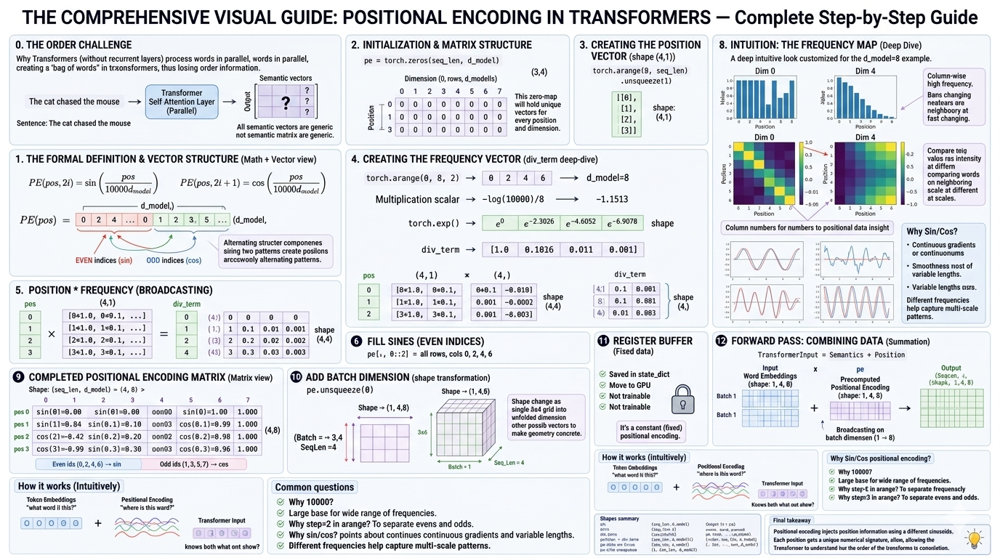

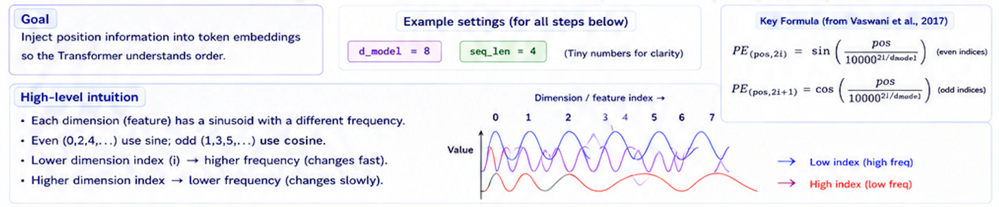

Why use **register_buffer(..., persistent=False)** for positional encodings?

Positional encodings are fixed, deterministic tensors that should move with the model across devices but do not need to be saved in checkpoints because they can be regenerated. Using persistent=False keeps them as buffers for device management while excluding them from the model's state_dict, reducing checkpoint size.

With **persistent=False**

```
self.register_buffer(
    "pe",
    pe,
    persistent=False
)
```
Now:

```
print(model.state_dict().keys())

Output:

[
 'embedding.weight',
 'linear.weight',
 'linear.bias'
]
```
is often preferred because:



*   Positional encoding is deterministic.
*   Can be regenerated.
*   Doesn't need checkpoint storage.
*   Still follows device moves automatically.







In [ ]:
class PositionalEmbedding(nn.Module):
  def __init__(self,seq_len, d_model):
    super().__init__()
    pe = torch.zeros(seq_len, d_model) # L,D
    self.position = torch.arange(0,seq_len).float().unsqueeze(1) # L,1
    self.div_term = torch.exp(torch.arange(0,d_model,2).float() * -(math.log(10000.0)/d_model)) # D/2
    pe[:,0::2] = torch.sin(self.position * self.div_term)
    pe[:,1::2] = torch.cos(self.position * self.div_term)
    pe = pe.unsqueeze(0) # 1,L,D
    self.register_buffer("pe",pe,persistent=False)

  def forward(self,x):
    B,L,D = x.size()
    pos = self.pe[:,:L,:]
    return pos



In [ ]:
posemb = PositionalEmbedding(seq_len=768,d_model=512)

In [ ]:
x_in = torch.rand(3,768,512)

In [ ]:
x_in.size()

torch.Size([3, 768, 512])

In [ ]:
x_out = posemb(x_in)

In [ ]:
x_out.size()

torch.Size([1, 768, 512])

In [ ]:
x_out[0].size()

torch.Size([768, 512])

In [ ]:
x_out[0]

tensor([[ 0.0000e+00,  1.0000e+00,  0.0000e+00,  ...,  1.0000e+00,
          0.0000e+00,  1.0000e+00],
        [ 8.4147e-01,  5.4030e-01,  8.2186e-01,  ...,  1.0000e+00,
          1.0366e-04,  1.0000e+00],
        [ 9.0930e-01, -4.1615e-01,  9.3641e-01,  ...,  1.0000e+00,
          2.0733e-04,  1.0000e+00],
        ...,
        [-9.9975e-01,  2.2187e-02,  3.0329e-01,  ...,  9.9662e-01,
          7.9219e-02,  9.9686e-01],
        [-5.2150e-01,  8.5325e-01, -6.1036e-01,  ...,  9.9661e-01,
          7.9323e-02,  9.9685e-01],
        [ 4.3622e-01,  8.9984e-01, -9.9873e-01,  ...,  9.9661e-01,
          7.9426e-02,  9.9684e-01]])

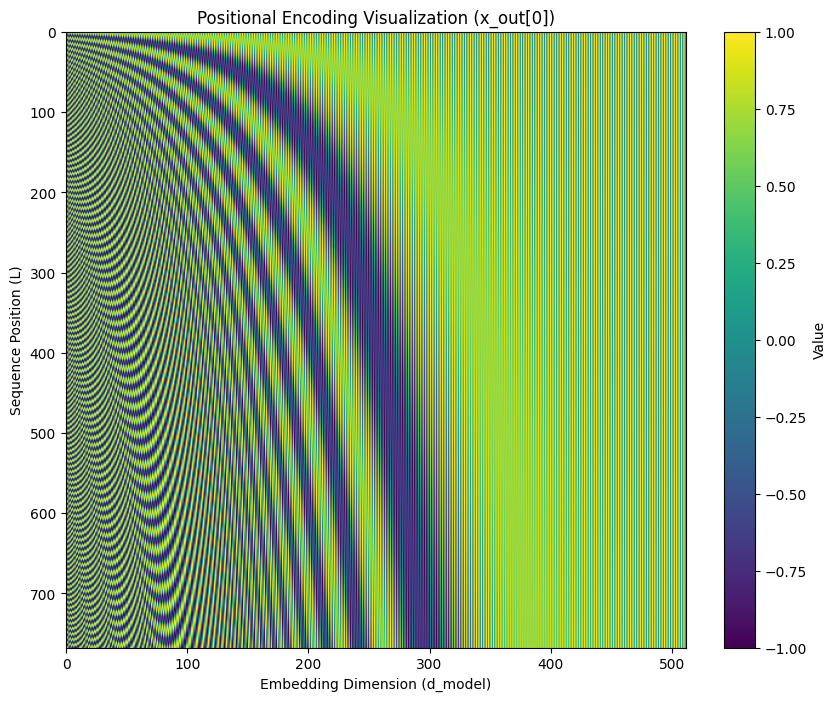

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(x_out[0].detach().cpu().numpy(), cmap='viridis', aspect='auto')
plt.colorbar(label='Value')
plt.xlabel('Embedding Dimension (d_model)')
plt.ylabel('Sequence Position (L)')
plt.title('Positional Encoding Visualization (x_out[0])')
plt.show()

## **EmbeddingModule**

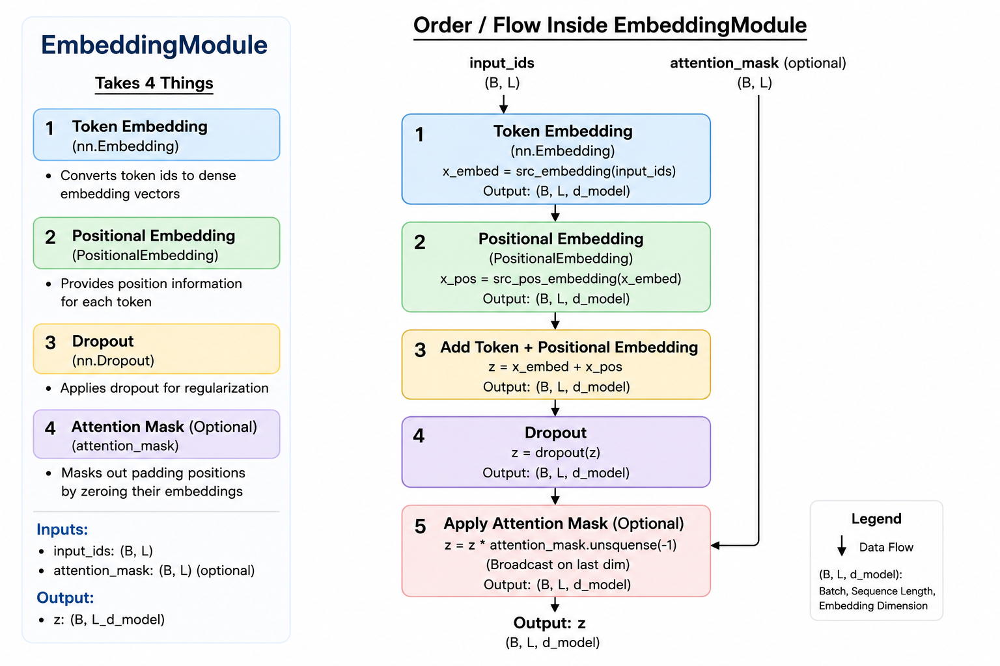

In [ ]:
class EmbeddingModule(nn.Module):
  def __init__(self,vocab_size,src_len,d_model,dropout,pad_id):
    super().__init__()
    self.src_embedding = nn.Embedding(vocab_size,d_model,padding_idx=pad_id)
    self.src_pos_embedding = PositionalEmbedding(src_len,d_model)
    self.dropout = nn.Dropout(dropout)

  def forward(self,input_ids,attention_mask):
    x_embed = self.src_embedding(input_ids)
    x_pos = self.src_pos_embedding(x_embed)
    z = x_embed + x_pos
    z = self.dropout(z)

    if attention_mask is not None:
      z = z * attention_mask.unsqueeze(-1)

    return z

In [ ]:
sentence = ["Hello world", "How are you", "My name is Sushovan Saha"]

x = tokenizer(sentence,
                padding=True,
                add_special_tokens=True,
                truncation=True,
                max_length=32,
                return_attention_mask=True,
                return_tensors="pt")

In [ ]:
x["input_ids"].size()

torch.Size([3, 8])

In [ ]:
embed = EmbeddingModule(vocab_size=len(tokenizer),
                        src_len=x["input_ids"].size(1),
                        d_model=512,
                        dropout=0.1,
                        pad_id=tokenizer.pad_token_id)

In [ ]:
x_out = embed(x["input_ids"],x["attention_mask"])

In [ ]:
x_out.shape

torch.Size([3, 8, 512])

In [ ]:
x["attention_mask"].shape

torch.Size([3, 8])

## **FeedForwardNetwork**

In [ ]:
class FeedForwardNetwork(nn.Module):
  def __init__(self,d_model,d_hidden):
    super().__init__()
    self.linear1 = nn.Linear(d_model,d_hidden)
    self.linear2 = nn.Linear(d_hidden,d_model)
    self.relu = nn.ReLU()
    self.dropout = nn.Dropout(0.1)


  def forward(self,x):
    x = self.linear1(x)
    x = self.relu(x)
    x = self.dropout(x)
    x = self.linear2(x)
    return x

In [ ]:
ffn = FeedForwardNetwork(d_model=512,d_hidden=2048)

In [ ]:
x_ffn_out = ffn(x_out)

In [ ]:
x_ffn_out.shape

torch.Size([3, 8, 512])

## **LayerNorm and AddNorm**


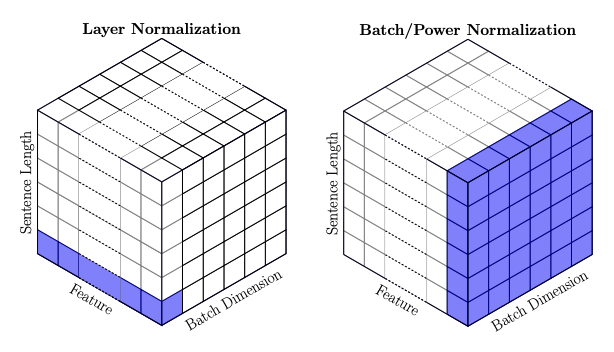

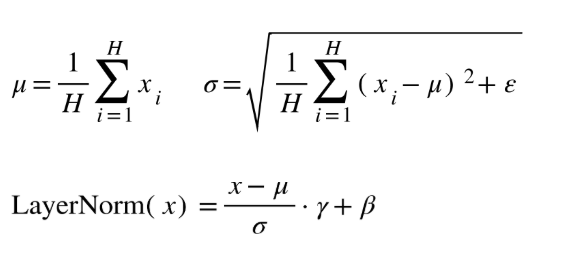

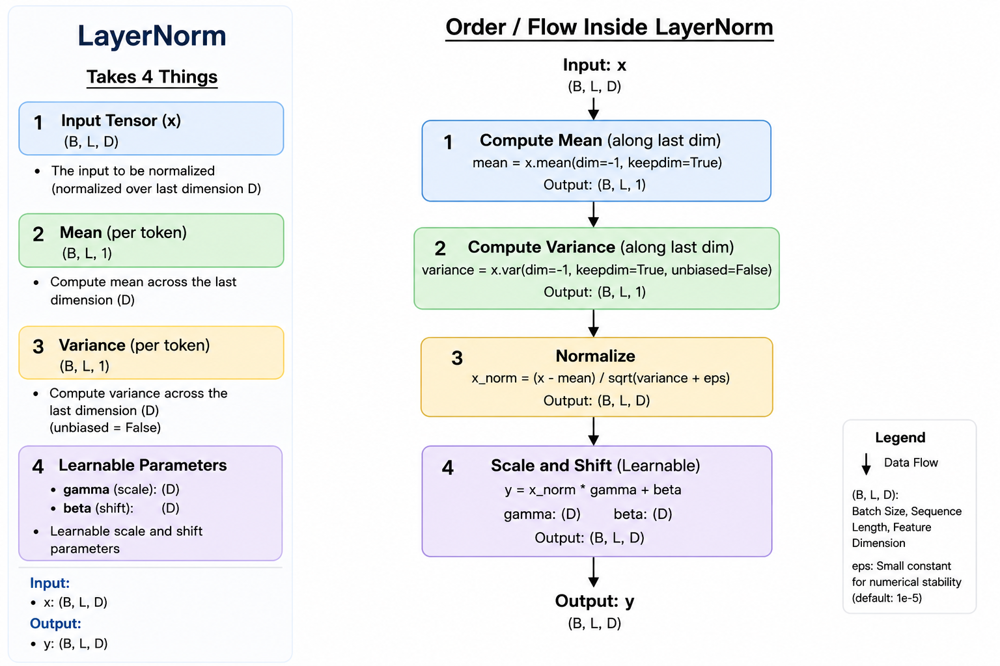

In [ ]:
import torch.nn as nn

class LayerNorm(nn.Module):
  def __init__(self, dim, eps=1e-5):
    super().__init__()
    self.gamma = nn.Parameter(torch.ones(dim))
    self.beta = nn.Parameter(torch.zeros(dim))
    self.eps = eps

  def forward(self,x):
    mean = x.mean(dim=-1, keepdim=True)
    variance = x.var(dim=-1, keepdim=True, unbiased=False)
    x = (x - mean) / torch.sqrt(variance + self.eps)
    return x * self.gamma + self.beta

In [ ]:
class AddNorm(nn.Module):
  def __init__(self, dim, dropout_rate=0.1):
    super().__init__()
    self.dropout = nn.Dropout(dropout_rate)
    self.norm = LayerNorm(dim)

  def forward(self,x,out):
    return self.norm(x + self.dropout(out))

In [ ]:
addnorm = AddNorm(dim=512)

In [ ]:
x_out_addnorm = addnorm(x_ffn_out,x_out)

In [ ]:
x_out_addnorm.shape

torch.Size([3, 8, 512])

## **ProjectionLayer**

In [ ]:
class ProjectionLayer(nn.Module):
  def __init__(self, d_model, vocab_size, dropout_rate=0.1):
    super().__init__()
    self.linear = nn.Linear(d_model, vocab_size)

  def forward(self,x):
    x = self.linear(x)
    return x

In [ ]:
len(tokenizer)

50258

In [ ]:
pl = ProjectionLayer(512,vocab_size=len(tokenizer))

In [ ]:
x_pl = pl(x_out_addnorm)

In [ ]:
x_pl.shape

torch.Size([3, 8, 50258])

In [ ]:
x_pl.size()

torch.Size([3, 8, 50258])

## **MultiHeadAttention**

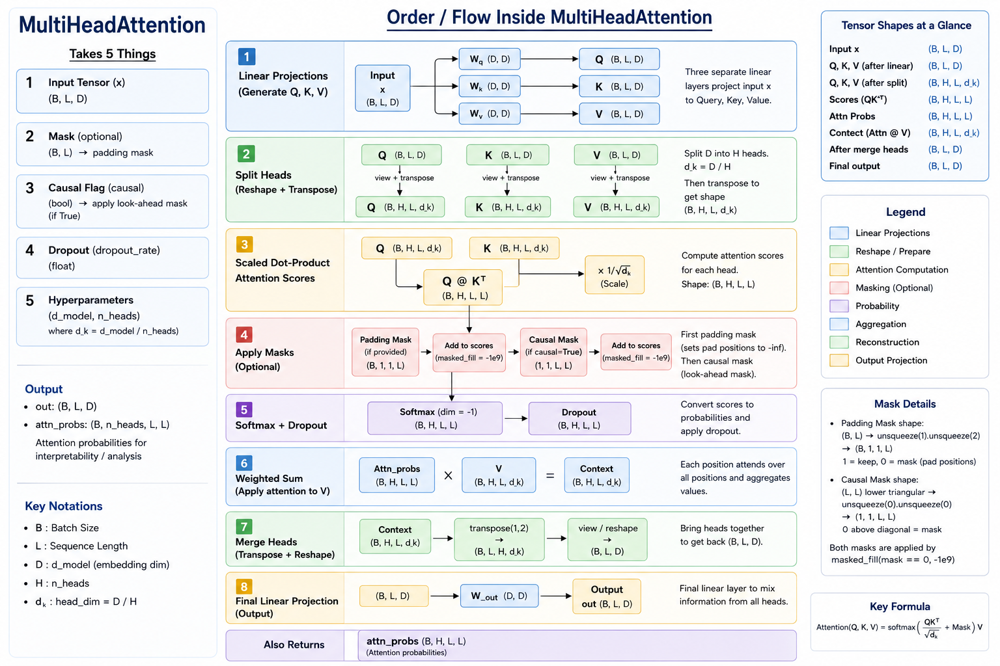

In [ ]:
t = torch.tril(torch.ones(3,3))
print("\n------------\n",t)
t = torch.tril(torch.ones(3,3),diagonal=1)
print("\n------------\n",t)
t = torch.triu(torch.ones(3,3))
print("\n------------\n",t)
t = torch.triu(torch.ones(3,3),diagonal=1)
print("\n------------\n",t)



------------
 tensor([[1., 0., 0.],
        [1., 1., 0.],
        [1., 1., 1.]])

------------
 tensor([[1., 1., 0.],
        [1., 1., 1.],
        [1., 1., 1.]])

------------
 tensor([[1., 1., 1.],
        [0., 1., 1.],
        [0., 0., 1.]])

------------
 tensor([[0., 1., 1.],
        [0., 0., 1.],
        [0., 0., 0.]])


In [ ]:
class MultiHeadAttention(nn.Module):
  def __init__(self, d_model ,n_heads, causal=True, dropout_rate=0.1):
    super().__init__()
    self.d_model = d_model
    self.n_heads = n_heads

    assert d_model % n_heads == 0, "d_model must be divisible by n_heads"

    self.head_dim = d_model // n_heads

    self.W_q = nn.Linear(d_model, d_model)
    self.W_k = nn.Linear(d_model, d_model)
    self.W_v = nn.Linear(d_model, d_model)
    self.W_out = nn.Linear(d_model, d_model)

    self.dropout = nn.Dropout(dropout_rate)
    self.softmax = nn.Softmax(dim=-1)

    self.scale = 1 / math.sqrt(self.head_dim)

    self.causal = causal

  def forward(self,x,mask=None):
    B,L,D = x.size() # B: Batch size, L: Sequence length, D: d_model

    # Linear transformations for Q, K, V
    Q = self.W_q(x) # Shape: B, L, D
    K = self.W_k(x) # Shape: B, L, D
    V = self.W_v(x) # Shape: B, L, D

    # Reshape and transpose for multi-head attention
    Q = Q.view(B,L,self.n_heads,self.head_dim).transpose(1,2) # Shape: B, n_heads, L, head_dim
    K = K.view(B,L,self.n_heads,self.head_dim).transpose(1,2) # Shape: B, n_heads, L, head_dim
    V = V.view(B,L,self.n_heads,self.head_dim).transpose(1,2) # Shape: B, n_heads, L, head_dim

    # K.transpose(-2,-1) changes K from (B, n_heads, L, head_dim) to (B, n_heads, head_dim, L)
    # attn_scores: (B, n_heads, L, head_dim) @ (B, n_heads, head_dim, L) -> (B, n_heads, L, L)
    attn_scores = torch.matmul(Q,K.transpose(-2,-1)) * self.scale # Shape: B, n_heads, L, L

    # Apply mask if provided (for padding)
    if mask is not None:
      mask = mask.unsqueeze(1).unsqueeze(2) # Shape: B, 1, 1, L
      attn_scores = attn_scores.masked_fill(mask==0, -1e9)

    # Apply causal mask for decoder (if self.causal is True)
    if self.causal:
      causal_mask = torch.tril(torch.ones(L,L)) # Shape: L, L
      causal_mask = causal_mask.unsqueeze(0).unsqueeze(0) # Shape: 1, 1, L, L
      attn_scores = attn_scores.masked_fill(causal_mask==0, -1e9)

    # Calculate attention probabilities
    attn_probs = self.softmax(attn_scores) # Shape: B, n_heads, L, L
    attn_probs = self.dropout(attn_probs) # Shape: B, n_heads, L, L

    # Apply attention probabilities to V
    # out: (B, n_heads, L, L) @ (B, n_heads, L, head_dim) -> (B, n_heads, L, head_dim)
    out = torch.matmul(attn_probs,V) # Shape: B, n_heads, L, head_dim

    # Transpose back and reshape to original d_model dimension
    out = out.transpose(1,2).contiguous() # Shape: B, L, n_heads, head_dim
    out = out.view(B,L,D) # Shape: B, L, D

    # Final linear projection
    out = self.W_out(out) # Shape: B, L, D

    return out, attn_probs

In [ ]:
mha = MultiHeadAttention(d_model=512, n_heads=4,causal=True)

In [ ]:
x_mha_out, attn_probs = mha(x_out)

In [ ]:
x_mha_out.shape

torch.Size([3, 8, 512])

In [ ]:
attn_probs.shape

torch.Size([3, 4, 8, 8])

## **EncoderBlock**

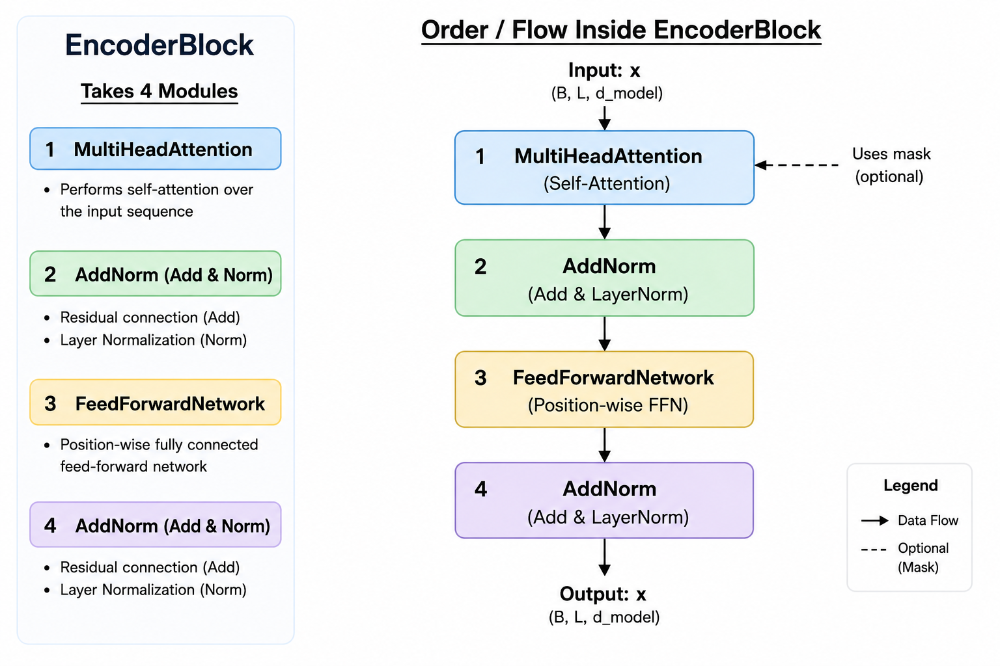

In [ ]:
class EncoderBlock(nn.Module):
  def __init__(self, d_model,d_hidden,n_heads, dropout_rate=0.1):
    super().__init__()
    self.mha = MultiHeadAttention(d_model, n_heads, causal=False)
    self.ffn = FeedForwardNetwork(d_model,d_hidden)
    self.addnorm1 = AddNorm(d_model, dropout_rate)
    self.addnorm2 = AddNorm(d_model, dropout_rate)

  def forward(self,x,mask=None):
    out, attn_weights = self.mha(x,mask)
    x = self.addnorm1(x,out)
    ffn_out = self.ffn(x)
    x = self.addnorm2(x,ffn_out)
    return x, attn_weights



In [ ]:
encdr_blck = EncoderBlock(d_model=512,d_hidden=2048,n_heads=4)

In [ ]:
x_encdr_blck_out, attn_weights = encdr_blck(x_out)

In [ ]:
x_encdr_blck_out.shape

torch.Size([3, 8, 512])

In [ ]:
attn_weights.shape

torch.Size([3, 4, 8, 8])

## **Encoder**

In [166]:
class Encoder(nn.Module):
  def __init__(self,vocab_size,src_len,pad_id,d_model,d_hidden,n_heads,n_layers,dropout_rate=0.1):
    super().__init__()
    self.embed = EmbeddingModule(vocab_size,src_len,d_model,dropout_rate,pad_id)
    self.layers = nn.ModuleList([EncoderBlock(d_model,d_hidden,n_heads, dropout_rate=0.1) for _ in range(n_layers)])
    self.lnorm = LayerNorm(d_model)


  def forward(self,input_ids,attention_mask):
    x = self.embed(input_ids,attention_mask)

    # 2. Pass through stacked EncoderBlocks
    attn_maps = []

    for layer in self.layers:
        x, attn = layer(x, attention_mask)
        attn_maps.append(attn)
    x = self.lnorm(x)

    return x, attn_maps


In [168]:
encdr = Encoder(vocab_size=len(tokenizer),
                src_len=x["input_ids"].size(1),
                pad_id=tokenizer.pad_token_id,
                d_model=512,
                d_hidden=2048,
                n_heads=4,
                n_layers=6
                )

In [169]:
x_encdr_out,attn_maps = encdr(input_ids=x["input_ids"],attention_mask=x["attention_mask"])

In [170]:
x_encdr_out.shape

torch.Size([3, 8, 512])

In [172]:
len(attn_maps)

6

In [173]:
attn_maps[0].shape

torch.Size([3, 4, 8, 8])